Useful links:
https://www.juliabloggers.com/basics-of-generating-random-numbers-in-julia/


In [1]:
using WAV
using Plots
using TickTock
using Statistics
using LaTeXStrings
print("Packages are ready for use")

Packages are ready for use

In [2]:
function generate_wav(samples, file_name)
    WAV.wavwrite(samples, file_name, Fs=4800)
    println(file_name, " has been generated")
end

generate_wav (generic function with 1 method)

### 1.2.1

In [3]:
function simplewhiten(n)
    white_noise = Array{Float64}(rand(4800*n)*2 .-1)
    println("Number of samples in simplewhiten: ", size(white_noise))
    return white_noise
end

simplewhiten (generic function with 1 method)

### 1.2.2

In [4]:
function createwhiten(n)
    samples = Array{Float64}(undef, 4800*n)
    
    for i in 1:size(samples, 1)
        samples[i] = rand()*2 - 1       
    end
    
    println("Number of samples in createwhiten: ", size(samples))
    return samples
end

createwhiten (generic function with 1 method)

In [5]:
simple = simplewhiten(10)
whiten = createwhiten(10)
generate_wav(simple, "white_noise_sound1.wav")
generate_wav(whiten, "white_noise_sound2.wav")

Number of samples in simplewhiten: (48000,)
Number of samples in createwhiten: (48000,)
white_noise_sound1.wav has been generated
white_noise_sound2.wav has been generated


### 1.2.3

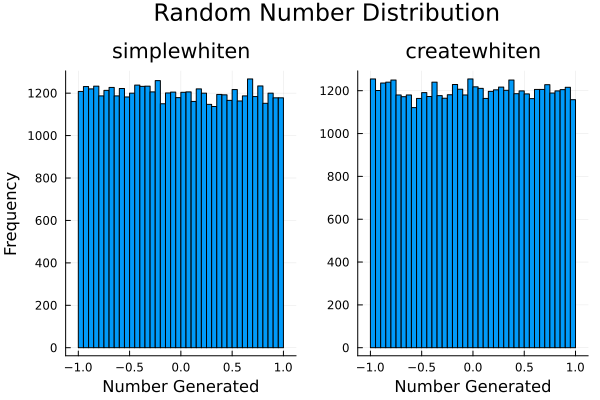

In [6]:
p1 = histogram(simple, title="simplewhiten", ylabel="Frequency") 
p2 = histogram(whiten, title="createwhiten")
plot(p1, p2, layout = (1, 2), plot_title = "Random Number Distribution", plot_titlevspan = 0.1, 
    xlabel = "Number Generated", legend=false, yformatter = :plain)

### 1.2.4

In [7]:
# For simplewhiten
# 1 second sleep command is used to ensure that tick() 
# starts before the noise array is generated.
# Then 1 second is deducted from the recorded time.
tick()
sleep(1)
simple = simplewhiten(100)
tock()

[ Info:  started timer at: 2023-03-24T13:49:22.460


Number of samples in simplewhiten: (480000,)


[ Info:            1.8197449s: 1 second, 819 milliseconds


In [8]:
# For createwhiten
tick()
sleep(1) 
whiten = createwhiten(100)
tock()

[ Info:  started timer at: 2023-03-24T13:49:24.513


Number of samples in createwhiten: (480000,)


[ Info:             1.018758s: 1 second, 18 milliseconds


In [9]:
0.7962621/0.2247312

3.54317558042675

### Results:

| Seconds(s) | Samples    | simplewhiten(s) | createwhiten(s) | Speed Up  |
| :--------- | :--------- | :----------:    | :----------:    | :------:  |
| 100        | 480 000    |  0.0221795      | 0.0147268       | 1.5060638 |
| 1 000      | 4 800 000  |  0.0923815      | 0.0589503       | 1.5671082 |
| 10 000     | 48 000 000 |  0.7962621      | 0.2247312       | 3.5431756 |

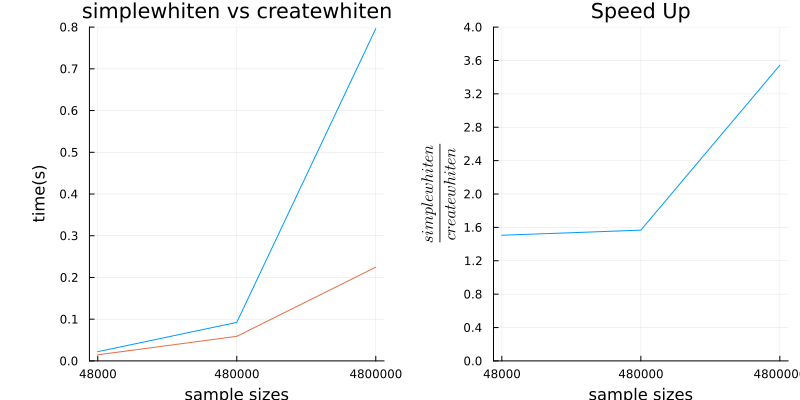

In [10]:
sample_sizes = [48000, 480000, 4800000]
sw_times = [0.0221795, 0.0923815, 0.7962621]
cw_times = [0.0147268, 0.0589503, 0.2247312]
speed_up = [1.5060638, 1.5671082, 3.5431756]

times = plot(sample_sizes, [sw_times cw_times], 
    title = "simplewhiten vs createwhiten", label = ["simplewhiten" "createwhiten"], 
    xlabel = "sample sizes", ylabel = "time(s)", ylim = (0, 0.8), yticks = 0:0.1:0.8,
    xticks = (sample_sizes, sample_sizes), xscale = :ln)

speed_ups = plot(sample_sizes, speed_up,
        title = "Speed Up", xlabel = "sample sizes" , ylabel = L"\frac{simplewhiten}{createwhiten}",
        label = false, xticks = (sample_sizes, sample_sizes), xscale = :ln,
        ylim = (0, 4), yticks = 0:0.4:4)

plot(times, speed_ups, layout = (1, 2), legend = false, left_margin = 10*Plots.mm, size = (800, 400))

### 1.2.5

$\Gamma = \frac{ \sum_{i=1}^n (x_i - \bar{x})(y_i - \bar{y})}{ \sqrt{ \sum_{i=1}^n (x_i - \bar{x})^2}\sqrt{\sum_{i=1}^n (y_i - \bar{y})^2} }$

In [11]:
function corr(x, y)           
    # Mean for x                   
    Σx = 0                          
    for xᵢ in x                      
        Σx = Σx + xᵢ
    end
    x̄ = Σx / size(x, 1)
    
    # Mean for y
    Σy = 0
    for yᵢ in y
        Σy = Σy + yᵢ
    end
    ȳ = Σy / size(y, 1)

    σxy = sum((x .- x̄) .* (y .- ȳ))    
    σx² = sum((x .- x̄).^2)
    σy² = sum((y .- ȳ).^2)
    
    r = σxy / (sqrt(σx²) * sqrt(σy²))
    return r
end

corr (generic function with 1 method)

### 1.2.6.1

In [32]:
x = simplewhiten(100)
y = createwhiten(100)
println("Calculating the correlation of createwhiten with itself:")
println("corr result: ", corr(x, x))
println("Statistics.cor result: ", Statistics.cor(x, x))
println("Calculating the correlation of createwhiten and simplewhiten:")
println("corr result:  ", corr(x, y))
println("Statistics.cor result:: ", Statistics.cor(x, y))

Number of samples in simplewhiten: (480000,)
Number of samples in createwhiten: (480000,)
Calculating the correlation of createwhiten with itself:
corr result: 1.0
Statistics.cor result: 1.0
Calculating the correlation of createwhiten and simplewhiten:
corr result:  -0.0016180980937638583
Statistics.cor result:: -0.0016180980937638585


In [13]:
println("My Pearson's correlation function result: ", corr(x, x))
println("Statistics package's Pearson's correlation function result: ", Statistics.cor(x, x))

My Pearson's correlation function result: 1.0000000000000002
Statistics package's Pearson's correlation function result: 1.0


### 1.2.6.2

In [31]:
println("My Pearson's correlation function result: ", corr(x, y))
println("Statistics package's Pearson's correlation function result: ", Statistics.cor(x, y))

My Pearson's correlation function result: 0.0032110445529536305
Statistics package's Pearson's correlation function result: 0.0032110445529536266


### Gathering data for sample sizes vs. corr speed vs. Statistics.cor speed

In [15]:
# Initializing white noise arrays
simple = simplewhiten(10000)
whiten = createwhiten(10000)
print("")

Number of samples in simplewhiten: (48000000,)
Number of samples in createwhiten: (48000000,)


In [16]:
# Timing my corr function
tick()
sleep(1)
corr(simple, whiten)
tock()

[ Info:  started timer at: 2023-03-24T13:49:31.149
[ Info:            1.8777863s: 1 second, 877 milliseconds


In [17]:
# Timing Statistics.cor function
tick()
sleep(1)
Statistics.cor(simple, whiten)
tock()

[ Info:  started timer at: 2023-03-24T13:49:33.023
[ Info:            1.1834213s: 1 second, 183 milliseconds


### Results:

| Sample size | corr speed(s) | Statistics.cor speed(s) | speed up  | 
| :---------- | :-----------: | :---------------------: | :-------: |
| 480 000     | 0.0261133     | 0.0182275               | 0.6980159 |
| 4 800 000   | 0.1036063     | 0.0322579               | 0.3113508 |
| 48 000 000  | 0.8693192     | 0.1941709               | 0.2233597 |

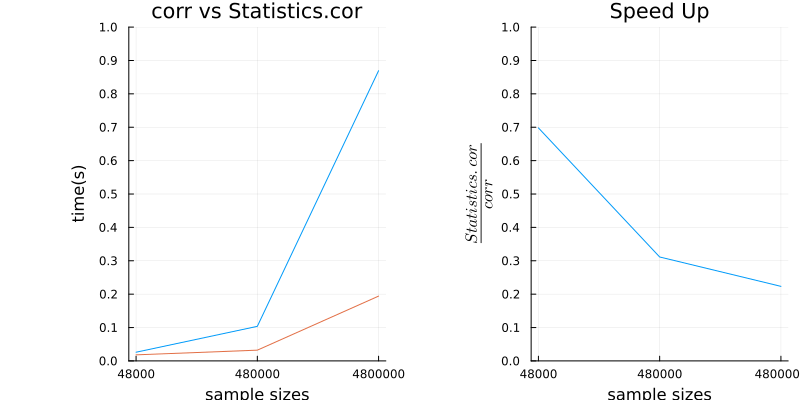

In [18]:
sample_sizes = [48000, 480000, 4800000]
corr_speeds = [0.0261133, 0.1036063, 0.8693192]
cor_speeds = [0.0182275, 0.0322579, 0.1941709]
speed_ups = [0.6980159, 0.3113508, 0.2233597]

times = plot(sample_sizes, [corr_speeds cor_speeds], 
    title = "corr vs Statistics.cor", label = ["corr" "Statistics.cor"], 
    xlabel = "sample sizes", ylabel = "time(s)", ylim = (0, 1), yticks = 0:0.1:1,
    xticks = (sample_sizes, sample_sizes), xscale = :ln)

speed_ups = plot(sample_sizes, speed_ups,
        title = "Speed Up", xlabel = "sample sizes" , ylabel = L"\frac{Statistics.cor}{corr}",
        label = false, xticks = (sample_sizes, sample_sizes), xscale = :ln,
        ylim = (0, 1), yticks = 0:0.1:1)

plot(times, speed_ups, layout = (1, 2), legend = false, left_margin = 20*Plots.mm, size = (800, 400))

### 1.2.7

In [19]:
function cor_shifted_frequencies(sine)
    shifts = collect(range(0, stop = (size(sine, 1) - 1), step = 1))
    correlation_data = Array{Float64}(undef, size(shifts, 1))
    i = 1
    
    for shift in shifts
        shifted_sine = circshift(sine, shift)
        correlation_data[i] = Statistics.cor(sine, shifted_sine)
        i += 1
    end
    
    return correlation_data    
end 

cor_shifted_frequencies (generic function with 1 method)

In [20]:
function sine_generator(n, f) # n is the sample size and f is the frequency
    x = Array{Float64}(collect(range(0, stop = 2π, length = n)))
    sine = Array{Float64}(sin.(f .* x))
    return sine    
end    

sine_generator (generic function with 1 method)

### 1Hz: 

In [43]:
# 100 samples
sine_100 = sine_generator(100, 1)
cor_100 = cor_shifted_frequencies(sine_100)

# 1000 samples
sine_1000 = sine_generator(1000, 1)
cor_1000 = cor_shifted_frequencies(sine_1000)

# 10000 samples
sine_10000 = sine_generator(10000, 1)
cor_10000 = cor_shifted_frequencies(sine_10000)
print("")

In [54]:
s100 = scatter((1:1:100), sine_100, mc=:red, ms=2, ma=0.5, title = "sin(x)")
c100 = scatter((1:1:100), cor_100, mc=:blue, ms=2, ma=0.5, title = "cor(sin(x), circ_sin(x))")
samples_100 = plot(s100, c100, layout = (1,2), legend=false,
            plot_title = "100 Samples")

s1000 = scatter((1:1:1000), sine_1000, mc=:red, ms=0.5, ma=0.2)
c1000 = scatter((1:1:1000), cor_1000, mc=:blue, ms=0.5, ma=0.2)
samples_1000 = plot(s1000, c1000, layout = (1,2), legend=false,
            plot_title = "1000 Samples")

s10000 = scatter((1:1:10000), sine_10000, mc=:red, ms=0.1, ma=0.1)
c10000 = scatter((1:1:10000), cor_10000, mc=:blue, ms=0.1, ma=0.1)
samples_10000 = plot(s10000, c10000, layout = (1,2), legend=false,
            plot_title = "10000 Samples")

plot(samples_100, samples_1000, samples_10000,
    layout = (3, 1), plot_title = "1Hz", plot_titlevspan = 0.1, 
    legend=false, yformatter = :plain, size = (800, 600))

### 10Hz:

In [55]:
sine_100 = sine_generator(100, 10)
cor_100 = cor_shifted_frequencies(sine_100)

# 1000 samples
sine_1000 = sine_generator(1000, 10)
cor_1000 = cor_shifted_frequencies(sine_1000)

# 10000 samples
sine_10000 = sine_generator(10000, 10)
cor_10000 = cor_shifted_frequencies(sine_10000)
print("")

In [58]:
s100 = scatter((1:1:100), sine_100, mc=:red, ms=2, ma=0.5, title = "sin(x)")
c100 = scatter((1:1:100), cor_100, mc=:blue, ms=2, ma=0.5, title = "cor(sin(x), circ_sin(x))")
samples_100 = plot(s100, c100, layout = (1,2), legend=false,
            plot_title = "100 Samples")

s1000 = scatter((1:1:1000), sine_1000, mc=:red, ms=0.5, ma=0.2)
c1000 = scatter((1:1:1000), cor_1000, mc=:blue, ms=0.5, ma=0.2)
samples_1000 = plot(s1000, c1000, layout = (1,2), legend=false,
            plot_title = "1000 Samples")

s10000 = scatter((1:1:10000), sine_10000, mc=:red, ms=0.1, ma=0.1)
c10000 = scatter((1:1:10000), cor_10000, mc=:blue, ms=0.1, ma=0.1)
samples_10000 = plot(s10000, c10000, layout = (1,2), legend=false,
            plot_title = "10000 Samples")

plot(samples_100, samples_1000, samples_10000,
    layout = (3, 1), plot_title = "10Hz", plot_titlevspan = 0.1, 
    legend=false, yformatter = :plain, size = (800, 600))

### 30Hz:

In [69]:
sine_100 = sine_generator(100, 30)
cor_100 = cor_shifted_frequencies(sine_100)

# 1000 samples
sine_1000 = sine_generator(1000, 30)
cor_1000 = cor_shifted_frequencies(sine_1000)

# 10000 samples
sine_10000 = sine_generator(10000, 30)
cor_10000 = cor_shifted_frequencies(sine_10000)
print("")

In [73]:
s100 = scatter((1:1:100), sine_100, mc=:red, ms=2, ma=0.5, title = "sin(x)")
c100 = scatter((1:1:100), cor_100, mc=:blue, ms=2, ma=0.5, title = "cor(sin(x), circ_sin(x))")
samples_100 = plot(s100, c100, layout = (1,2), legend=false,
            plot_title = "100 Samples")

s1000 = scatter((1:1:1000), sine_1000, mc=:red, ms=0.5, ma=0.2)
c1000 = scatter((1:1:1000), cor_1000, mc=:blue, ms=0.5, ma=0.2)
samples_1000 = plot(s1000, c1000, layout = (1,2), legend=false,
            plot_title = "1000 Samples")

s10000 = scatter((1:1:10000), sine_10000, mc=:red, ms=0.1, ma=0.1)
c10000 = scatter((1:1:10000), cor_10000, mc=:blue, ms=0.1, ma=0.1)
samples_10000 = plot(s10000, c10000, layout = (1,2), legend=false,
            plot_title = "10000 Samples")

plot(samples_100, samples_1000, samples_10000,
    layout = (3, 1), plot_title = "30Hz", plot_titlevspan = 0.1, 
    legend=false, yformatter = :plain, size = (800, 600))

### Example of 1 sample for the correlation data:

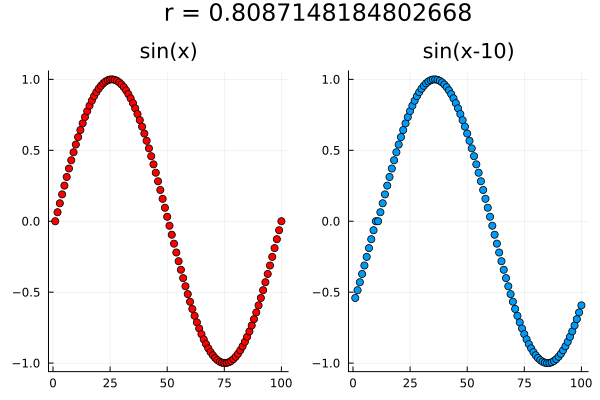

In [84]:
f = sine_generator(100, 1)
f_shifted = circshift(f, 10)
c = Statistics.cor(f, f_shifted)
out = "r = $c"

f_plt = scatter(f, title = "sin(x)", mc = :red)
fs_plt = scatter(f_shifted, title = "sin(x-10)")

plot(f_plt, fs_plt, legend = false, layout = (1,2), plot_title = out, plot_titlevspan = 0.1)